In [1]:
import yaml
import subprocess
import glob
import numpy as np
import os

import matplotlib.pyplot as plt

In [2]:
# Function to replace the placeholder with the relaxation parameter in the template YAML file
def create_yaml_from_template(template_path, output_path, placeholder, new_value):
    with open(template_path, 'r') as file:
        content = file.read()

    # Replace the placeholder with the new relaxation parameter value
    updated_content = content.replace(placeholder, str(new_value))

    # Write the updated content to the output file
    with open(output_path, 'w') as file:
        file.write(updated_content)

# Function to run the Julia command
def run_julia_command():
    command = ["julia", "--project=@.", "/Users/bphung/Work/software/Norma.jl/src/Norma.jl", "cubes.yaml"]
    subprocess.run(command, check=True)

# Function to read the latest convergence values CSV file into a NumPy array
def read_latest_convergence_values():
    # Get the latest file matching the pattern
    list_of_files = glob.glob("convergence_values-*.csv")
    latest_file = max(list_of_files, key=os.path.getctime)

    # Read the CSV file into a NumPy array
    data = np.loadtxt(latest_file, delimiter=',', skiprows=0)  # Adjust skiprows if there's a header
    return data

def calculate_convergence_rate(errors):
    """Calculate the convergence rate for the last half of the error values."""
    n = len(errors)
    if n < 2:
        print(errors)
        raise ValueError("Not enough data points to calculate convergence rate.")
    
    # Extract the last half of the errors
    last_half_errors = errors[n // 2:]

    # Calculate log of the errors
    log_errors = np.log(last_half_errors)

    # Create an array of iteration indices for the last half
    iterations = np.arange(len(log_errors))

    # Fit a linear polynomial (degree 1) to the log errors
    slope, intercept = np.polyfit(iterations, log_errors, 1)
    return slope

In [3]:
number_of_iterations = []
rate_of_convergence_a = []
rate_of_convergence_r = []
relaxation_parameters = np.linspace(0,1.0,21)
for relaxation in relaxation_parameters:
    template_file_path = "cubes-template.yaml"
    output_file_path = "cubes.yaml"
    placeholder = "{replace_yaml}"  # Placeholder to be replaced
    new_relaxation_value = relaxation  # Change this to the desired relaxation parameter value

    # Create cubes.yaml from the template
    create_yaml_from_template(template_file_path, output_file_path, placeholder, new_relaxation_value)

    # Run the Julia command
    try:
        run_julia_command()
        # Read the latest convergence values into a NumPy array
        convergence_data = read_latest_convergence_values()
        convergence_data = convergence_data[np.nonzero(convergence_data)]
        convergence_absolute = convergence_data[0::2]
        convergence_relative = convergence_data[1::2]
        number_of_iterations.append(len(convergence_data) // 2 )
        try:
            convergence_rate_a = calculate_convergence_rate(convergence_absolute)
            convergence_rate_r = calculate_convergence_rate(convergence_relative)
        except:
            convergence_rate_a = -np.log(convergence_absolute[-1])
            convergence_rate_r = -np.log(convergence_relative[-1])
    except:
        convergence_rate_a = -np.inf
        convergence_rate_r = -np.inf
        number_of_iterations.append(np.inf)

    
    rate_of_convergence_a.append(convergence_rate_a)
    rate_of_convergence_r.append(convergence_rate_r)


[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Debugging disabled


Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Non-positive Jacobian detected! This may indicate element distortion. Attempting to recover by adjusting time step size...
ERROR: LoadError: Cannot adapt time step 0.1 because decrease factor is 1.0. Enable adaptive time stepping.
Stacktrace:
  [1] error(::String, ::Float64, ::String, ::Float64, ::String)
    @ Base ./error.jl:44
  [2] decrease_time_step(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:45
  [3] advance(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:88
  [4] subcycle(sim::Main.Norma.MultiDomainSimulation, is_schwarz::Bool)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:292
  [5] schwarz(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:142
  [6] solve_contact(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:34
  [7] advance(sim::Main.Norma.MultiDomainSimulation)
    @

Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Non-positive Jacobian detected! This may indicate element distortion. Attempting to recover by adjusting time step size...
ERROR: LoadError: Cannot adapt time step 0.1 because decrease factor is 1.0. Enable adaptive time stepping.
Stacktrace:
  [1] error(::String, ::Float64, ::String, ::Float64, ::String)
    @ Base ./error.jl:44
  [2] decrease_time_step(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:45
  [3] advance(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:88
  [4] subcycle(sim::Main.Norma.MultiDomainSimulation, is_schwarz::Bool)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:292
  [5] schwarz(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:142
  [6] solve_contact(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:34
  [7] advance(sim::Main.Norma.MultiDomainSimulation)
    @

Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Non-positive Jacobian detected! This may indicate element distortion. Attempting to recover by adjusting time step size...
ERROR: LoadError: Cannot adapt time step 0.1 because decrease factor is 1.0. Enable adaptive time stepping.
Stacktrace:
  [1] error(::String, ::Float64, ::String, ::Float64, ::String)
    @ Base ./error.jl:44
  [2] decrease_time_step(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:45
  [3] advance(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:88
  [4] subcycle(sim::Main.Norma.MultiDomainSimulation, is_schwarz::Bool)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:292
  [5] schwarz(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:142
  [6] solve_contact(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:34
  [7] advance(sim::Main.Norma.MultiDomainSimulation)
    @

Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Non-positive Jacobian detected! This may indicate element distortion. Attempting to recover by adjusting time step size...
ERROR: LoadError: Cannot adapt time step 0.1 because decrease factor is 1.0. Enable adaptive time stepping.
Stacktrace:
  [1] error(::String, ::Float64, ::String, ::Float64, ::String)
    @ Base ./error.jl:44
  [2] decrease_time_step(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:45
  [3] advance(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:88
  [4] subcycle(sim::Main.Norma.MultiDomainSimulation, is_schwarz::Bool)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:292
  [5] schwarz(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:142
  [6] solve_contact(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:34
  [7] advance(sim::Main.Norma.MultiDomainSimulation)
    @

Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Non-positive Jacobian detected! This may indicate element distortion. Attempting to recover by adjusting time step size...
ERROR: LoadError: Cannot adapt time step 0.1 because decrease factor is 1.0. Enable adaptive time stepping.
Stacktrace:
  [1] error(::String, ::Float64, ::String, ::Float64, ::String)
    @ Base ./error.jl:44
  [2] decrease_time_step(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:45
  [3] advance(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:88
  [4] subcycle(sim::Main.Norma.MultiDomainSimulation, is_schwarz::Bool)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:292
  [5] schwarz(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:142
  [6] solve_contact(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:34
  [7] advance(sim::Main.Norma.MultiDomainSimulation)
    @

Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

ERROR: LoadError: Closest point projection failed to converge
Stacktrace:
  [1] error(s::String)
    @ Base ./error.jl:35
  [2] closest_point_projection(parametric_dim::Int64, nodes::Matrix{Float64}, x::Vector{Float64})
    @ Main.Norma ~/Work/software/Norma.jl/src/interpolation.jl:970
  [3] project_point_to_side_set(point::Vector{Float64}, model::Main.Norma.SolidMechanics, side_set_id::Int64)
    @ Main.Norma ~/Work/software/Norma.jl/src/interpolation.jl:731
  [4] apply_sm_schwarz_contact_dirichlet(model::Main.Norma.SolidMechanics, bc::Main.Norma.SMContactSchwarzBC)
    @ Main.Norma ~/Work/software/Norma.jl/src/ics_bcs.jl:684
  [5] apply_bc_detail
    @ ~/Work/software/Norma.jl/src/ics_bcs.jl:410 [inlined]
  [6] apply_bc(model::Main.Norma.SolidMechanics, bc::Main.Norma.SMContactSchwarzBC)
    @ Main.Norma ~/Work/software/Norma.jl/src/ics_bcs.jl:571
  [7] apply_bcs(model::Main.Norma.SolidMechanics)
    @ Main.Norma ~/Work/software/Norma.jl/src/ics_bcs.jl:962
  [8] apply_bcs(sim::Main.N

Reading simulation file: cubes.yaml
Reading subsimulation file: cube-1.yaml
Reading subsimulation file: cube-2.yaml
Requested time step is 0.1
Adjusted time step is 0.1 with 41 stops
Initializing run at stop 0 with time = -4.00e+00
Establishing initial equilibrium
|R|=3.455941881629901e-7
|R|=1.3677536571061726e-7, solver iteration=1
Establishing initial equilibrium
|R|=2.025952700709977e-7
|R|=1.2344123842060632e-7, solver iteration=1
contact false
Advancing from stop 0 with time = -4.00e+00 to stop 1 with time = -3.90e+00
subcycle cube-1.yaml
|R|=1.5068664685999125e-7
|R|=2.0265471572915482e-7, solver iteration=1
subcycle cube-2.yaml
|R|=2.0258030543069492e-7
|R|=1.2701310859182088e-7, solver iteration=1
contact false
Advancing from stop 1 with time = -3.90e+00 to stop 2 with time = -3.80e+00
subcycle cube-1.yaml
|R|=3.194166863194728e-7
|R|=2.3463388687362334e-7, solver iteration=1
subcycle cube-2.yaml
|R|=1.4991371303238505e-7
|R|=1.4925017212038057e-7, solver iteration=1
contact f

[ Info: Non-positive Jacobian detected! This may indicate element distortion. Attempting to recover by adjusting time step size...
ERROR: LoadError: Cannot adapt time step 0.1 because decrease factor is 1.0. Enable adaptive time stepping.
Stacktrace:
  [1] error(::String, ::Float64, ::String, ::Float64, ::String)
    @ Base ./error.jl:44
  [2] decrease_time_step(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:45
  [3] advance(sim::Main.Norma.SingleDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:88
  [4] subcycle(sim::Main.Norma.MultiDomainSimulation, is_schwarz::Bool)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:292
  [5] schwarz(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/schwarz.jl:142
  [6] solve_contact(sim::Main.Norma.MultiDomainSimulation)
    @ Main.Norma ~/Work/software/Norma.jl/src/evolve.jl:34
  [7] advance(sim::Main.Norma.MultiDomainSimulation)
    @

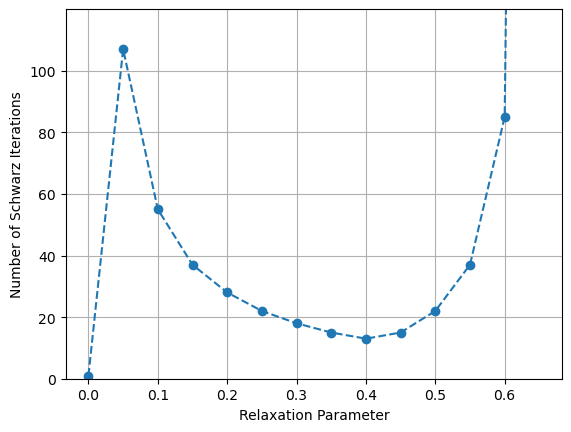

In [8]:

# number_of_iterations = []
# rate_of_convergence_a = []
# rate_of_convergence_r = []
# relaxation_parameters = np.linspace(0,1.0,11)
plt.plot(relaxation_parameters, np.array(number_of_iterations), 'o--')
plt.xlabel('Relaxation Parameter')
plt.ylabel('Number of Schwarz Iterations')
plt.yticks(np.arange(0, 120, step=20))
plt.ylim([0,120])
plt.grid()
plt.savefig('Schwarz_Iterations.png')


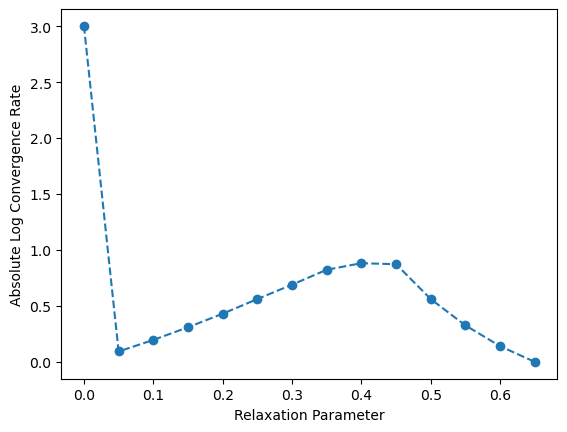

In [9]:
plt.plot(relaxation_parameters, np.abs(rate_of_convergence_a), 'o--')
plt.xlabel('Relaxation Parameter')
plt.ylabel('Absolute Log Convergence Rate')
plt.savefig('absolute_convergence.png')

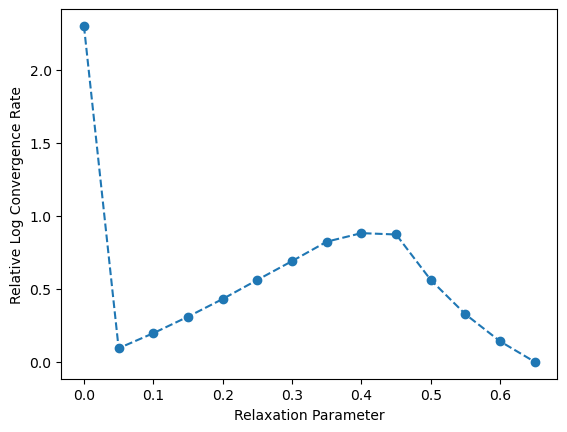

In [10]:
plt.plot(relaxation_parameters, np.abs(rate_of_convergence_r), 'o--')
plt.xlabel('Relaxation Parameter')
plt.ylabel('Relative Log Convergence Rate')
plt.savefig('relative_convergence.png')